In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/competitions/26-t-1-dl-gen-ainppe-1/sample_submission.csv
/kaggle/input/competitions/26-t-1-dl-gen-ainppe-1/train.csv
/kaggle/input/competitions/26-t-1-dl-gen-ainppe-1/test.csv
/kaggle/input/competitions/26-t-1-dl-gen-ainppe-1/images/32258b566bba41018fbfbc8cce95d6dc.png
/kaggle/input/competitions/26-t-1-dl-gen-ainppe-1/images/c653d938386447e58ab9a53f7100fa46.png
/kaggle/input/competitions/26-t-1-dl-gen-ainppe-1/images/1760d71394de469aa5fb39efbeee905b.png
/kaggle/input/competitions/26-t-1-dl-gen-ainppe-1/images/eca6f027f8df442b9d7ff417f9f44f9d.png
/kaggle/input/competitions/26-t-1-dl-gen-ainppe-1/images/eb307364f199495a90644e1834572135.png
/kaggle/input/competitions/26-t-1-dl-gen-ainppe-1/images/ff874d9944954702a9258ab1d43dc55c.png
/kaggle/input/competitions/26-t-1-dl-gen-ainppe-1/images/fe33b28e22874e9e88769497ee0a0a2c.png
/kaggle/input/competitions/26-t-1-dl-gen-ainppe-1/images/2f1d692ac73340949e5f353937381529.png
/kaggle/input/competitions/26-t-1-dl-gen-ainppe-1/images/

In [2]:
# ============================================================
# Cell 1: Imports & Configuration
# ============================================================
import os
import gc
import random
import warnings
import numpy as np
import pandas as pd
from PIL import Image
from collections import Counter

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torch.cuda.amp import autocast, GradScaler
import torch.nn.functional as F

import torchvision.transforms as T
import torchvision.models as models

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix

import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.auto import tqdm

warnings.filterwarnings("ignore")

# ---- Reproducibility ----
SEED = 42
def seed_everything(seed=SEED):
    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    # benchmark=True lets cuDNN auto-tune conv kernels → faster after 1st epoch
    # (removed deterministic=True as it conflicts with benchmark=True)
    torch.backends.cudnn.benchmark = True

seed_everything()

# ---- Paths ----
BASE_DIR   = "/kaggle/input/competitions/26-t-1-dl-gen-ainppe-1"
IMG_DIR    = os.path.join(BASE_DIR, "images")
TRAIN_CSV  = os.path.join(BASE_DIR, "train.csv")
TEST_CSV   = os.path.join(BASE_DIR, "test.csv")
SAMPLE_SUB = os.path.join(BASE_DIR, "sample_submission.csv")

# ---- Hyper-parameters ----
IMG_SIZE       = 256          # resize target
BATCH_SIZE     = 64           # per-GPU effective batch
NUM_WORKERS    = 4
NUM_EPOCHS     = 20
LR             = 3e-4
WEIGHT_DECAY   = 1e-4
N_FOLDS        = 5            # stratified k-fold
TRAIN_FOLDS    = [0, 1, 2]    # train on 3 folds, validate on remaining 2
FN_WEIGHT      = 5.0          # asymmetric FN penalty
FP_WEIGHT      = 1.0          # FP penalty

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
NUM_GPUS = torch.cuda.device_count()
print(f"Device: {DEVICE}  |  GPUs available: {NUM_GPUS}")

def print_gpu_stats():
    """Print memory usage for each GPU."""
    for i in range(NUM_GPUS):
        alloc = torch.cuda.memory_allocated(i) / 1024**3
        total = torch.cuda.get_device_properties(i).total_memory / 1024**3
        print(f"  GPU {i}: {alloc:.2f} GB / {total:.2f} GB  ({alloc/total*100:.1f}% used)")

print_gpu_stats()

Device: cuda  |  GPUs available: 2
  GPU 0: 0.00 GB / 14.56 GB  (0.0% used)
  GPU 1: 0.00 GB / 14.56 GB  (0.0% used)


Train shape : (51043, 21)
Test shape  : (17015, 1)
Num classes : 20
Classes     : ['Atelectasis', 'Cardiomegaly', 'Consolidation', 'Edema', 'Effusion', 'Emphysema', 'Fibrosis', 'Hernia', 'Infiltration', 'Mass', 'Nodule', 'Pleural_Thickening', 'Pneumonia', 'Pneumothorax', 'Pneumoperitoneum', 'Pneumomediastinum', 'Subcutaneous Emphysema', 'Tortuous Aorta', 'Calcification of the Aorta', 'No Finding']

--- Class Distribution ---
   0  Atelectasis                       2351  (4.61%)
   1  Cardiomegaly                       600  (1.18%)
   2  Consolidation                      651  (1.28%)
   3  Edema                              326  (0.64%)
   4  Effusion                          2156  (4.22%)
   5  Emphysema                          172  (0.34%)
   6  Fibrosis                           389  (0.76%)
   7  Hernia                              37  (0.07%)
   8  Infiltration                      5206  (10.20%)
   9  Mass                              1249  (2.45%)
  10  Nodule                  

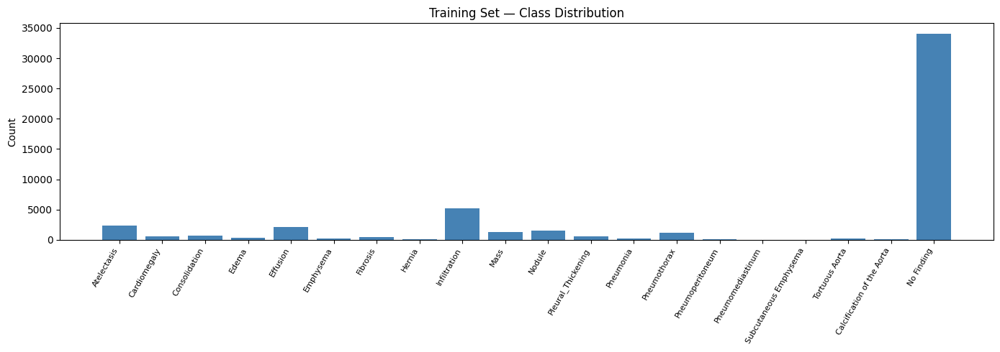

In [3]:
# ============================================================
# Cell 2: Data Exploration & Class Distribution
# ============================================================
train_df = pd.read_csv('/kaggle/input/competitions/26-t-1-dl-gen-ainppe-1/train.csv')
test_df  = pd.read_csv('/kaggle/input/competitions/26-t-1-dl-gen-ainppe-1/test.csv')
sample_sub = pd.read_csv('/kaggle/input/competitions/26-t-1-dl-gen-ainppe-1/sample_submission.csv')

CLASS_NAMES = [c for c in train_df.columns if c != "id"]
NUM_CLASSES = len(CLASS_NAMES)

print(f"Train shape : {train_df.shape}")
print(f"Test shape  : {test_df.shape}")
print(f"Num classes : {NUM_CLASSES}")
print(f"Classes     : {CLASS_NAMES}")

# Derive single-label column
train_df["label"] = train_df[CLASS_NAMES].values.argmax(axis=1)

# Class distribution
class_counts = train_df["label"].value_counts().sort_index()
print("\n--- Class Distribution ---")
for idx, name in enumerate(CLASS_NAMES):
    cnt = class_counts.get(idx, 0)
    print(f"  {idx:2d}  {name:30s}  {cnt:6d}  ({cnt/len(train_df)*100:.2f}%)")

# Plot
fig, ax = plt.subplots(figsize=(14, 5))
ax.bar(range(NUM_CLASSES), [class_counts.get(i, 0) for i in range(NUM_CLASSES)],
       color="steelblue")
ax.set_xticks(range(NUM_CLASSES))
ax.set_xticklabels(CLASS_NAMES, rotation=60, ha="right", fontsize=8)
ax.set_ylabel("Count")
ax.set_title("Training Set — Class Distribution")
plt.tight_layout()
plt.show()


In [4]:
# ============================================================
# Cell 3: Dataset & Data Loaders
# ============================================================

class ChestXrayDataset(Dataset):
    def __init__(self, df, img_dir, transform=None, is_test=False):
        self.df        = df.reset_index(drop=True)
        self.img_dir   = img_dir
        self.transform = transform
        self.is_test   = is_test

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row   = self.df.iloc[idx]
        img_id = row["id"]
        img_path = os.path.join(self.img_dir, img_id)

        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)

        if self.is_test:
            return image, img_id
        else:
            label = int(row["label"])
            return image, label


# ---- Transforms ----
train_transforms = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.RandomHorizontalFlip(p=0.5),
    T.RandomRotation(10),
    T.ColorJitter(brightness=0.2, contrast=0.2),
    T.RandomAffine(degrees=0, translate=(0.05, 0.05), scale=(0.95, 1.05)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]),
])

val_transforms = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]),
])

tta_transforms = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.RandomHorizontalFlip(p=0.5),
    T.RandomRotation(5),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]),
])

print("Dataset & transforms defined ✓")


Dataset & transforms defined ✓


In [5]:
# ============================================================
# Cell 4: Model Definition — DenseNet121 Fine-Tune
# ============================================================

class ChestXrayModel(nn.Module):
    """DenseNet-121 backbone with custom classifier head."""
    def __init__(self, num_classes=20, pretrained=True, dropout=0.4):
        super().__init__()
        self.backbone = models.densenet121(
            weights=models.DenseNet121_Weights.IMAGENET1K_V1 if pretrained else None
        )
        in_features = self.backbone.classifier.in_features
        self.backbone.classifier = nn.Identity()  # remove original head

        self.head = nn.Sequential(
            nn.BatchNorm1d(in_features),
            nn.Dropout(dropout),
            nn.Linear(in_features, 512),
            nn.ReLU(inplace=True),
            nn.BatchNorm1d(512),
            nn.Dropout(dropout / 2),
            nn.Linear(512, num_classes),
        )

    def forward(self, x):
        features = self.backbone(x)
        return self.head(features)


# ---- Balanced Loss (train for good representations, apply cost at inference) ----
class BalancedCELoss(nn.Module):
    """
    Cross-entropy with SQRT inverse-frequency class weights.
    Key insight: DON'T bake the asymmetric FN penalty into training.
    Train for balanced accuracy, then apply cost-sensitive prediction
    at inference time. This prevents the model from ignoring No Finding.
    """
    def __init__(self, class_counts, num_classes, smoothing=0.05):
        super().__init__()
        total = sum(class_counts.values())
        weights = []
        for c in range(num_classes):
            freq = class_counts.get(c, 1)
            # sqrt inverse-frequency: gentle balancing
            w = np.sqrt(total / (num_classes * freq))
            weights.append(w)
        w_tensor = torch.tensor(weights, dtype=torch.float32)
        w_tensor = w_tensor / w_tensor.sum() * num_classes  # normalise
        self.register_buffer("weight", w_tensor)
        self.smoothing = smoothing
        self.num_classes = num_classes

    def forward(self, logits, targets):
        log_probs = F.log_softmax(logits, dim=1)
        with torch.no_grad():
            smooth = torch.full_like(log_probs, self.smoothing / (self.num_classes - 1))
            smooth.scatter_(1, targets.unsqueeze(1), 1.0 - self.smoothing)
        loss = -(smooth * log_probs).sum(dim=1)
        w = self.weight[targets]
        loss = (loss * w).mean()
        return loss


print("Model & loss defined ✓")

Model & loss defined ✓


In [6]:
# ============================================================
# Cell 5: Training & Validation Functions
# ============================================================

def compute_competition_score(y_true, y_pred, num_classes=20):
    """Macro-averaged asymmetric cost score."""
    class_scores = []
    for c in range(num_classes):
        tp = ((y_pred == c) & (y_true == c)).sum()
        fp = ((y_pred == c) & (y_true != c)).sum()
        fn = ((y_pred != c) & (y_true == c)).sum()
        n_c = (y_true == c).sum()
        if n_c == 0:
            continue
        score_c = (tp - fp - FN_WEIGHT * fn) / n_c
        class_scores.append(score_c)
    return np.mean(class_scores)


def train_one_epoch(model, loader, criterion, optimizer, scaler, device):
    model.train()
    running_loss = 0.0
    all_preds, all_labels = [], []

    pbar = tqdm(loader, desc="  Train", leave=False)
    for images, labels in pbar:
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)
        with autocast():
            logits = model(images)
            loss = criterion(logits, labels)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item() * images.size(0)
        preds = logits.argmax(dim=1).cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(labels.cpu().numpy())
        pbar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_loss = running_loss / len(loader.dataset)
    epoch_score = compute_competition_score(
        np.array(all_labels), np.array(all_preds)
    )
    return epoch_loss, epoch_score


@torch.no_grad()
def validate(model, loader, criterion, device):
    model.eval()
    running_loss = 0.0
    all_preds, all_labels = [], []

    pbar = tqdm(loader, desc="  Valid", leave=False)
    for images, labels in pbar:
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        with autocast():
            logits = model(images)
            loss = criterion(logits, labels)

        running_loss += loss.item() * images.size(0)
        preds = logits.argmax(dim=1).cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(labels.cpu().numpy())
        pbar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_loss = running_loss / len(loader.dataset)
    epoch_score = compute_competition_score(
        np.array(all_labels), np.array(all_preds)
    )
    return epoch_loss, epoch_score, np.array(all_preds), np.array(all_labels)


print("Training functions defined ✓")


Training functions defined ✓


In [7]:
# ============================================================
# Cell 6: Train with Stratified K-Fold
# ============================================================

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED)
fold_models = []
fold_val_scores = []

fold_pbar = tqdm(enumerate(skf.split(train_df, train_df["label"])),
                 total=N_FOLDS, desc="Folds")
for fold_idx, (train_idx, val_idx) in fold_pbar:
    fold_pbar.set_description(f"Fold {fold_idx + 1}/{N_FOLDS}")
    print(f"\n{'='*60}")
    print(f"  FOLD {fold_idx + 1} / {N_FOLDS}")
    print(f"{'='*60}")

    if fold_idx not in TRAIN_FOLDS:
        print("  ➜ Skipping this fold (not in TRAIN_FOLDS)")
        continue

    df_train_fold = train_df.iloc[train_idx]
    df_val_fold   = train_df.iloc[val_idx]

    # ---- Weighted sampler (sqrt-balanced, not full inverse) ----
    labels_train = df_train_fold["label"].values
    class_sample_count = np.bincount(labels_train, minlength=NUM_CLASSES).astype(float)
    class_sample_count[class_sample_count == 0] = 1.0
    # sqrt softens oversampling: rare classes get boosted but majority
    # classes (No Finding) are NOT suppressed to near-zero
    sample_weights = 1.0 / np.sqrt(class_sample_count[labels_train])
    sampler = WeightedRandomSampler(
        weights=sample_weights,
        num_samples=len(df_train_fold),
        replacement=True,
    )

    train_ds = ChestXrayDataset(df_train_fold, IMG_DIR, transform=train_transforms)
    val_ds   = ChestXrayDataset(df_val_fold,   IMG_DIR, transform=val_transforms)

    train_loader = DataLoader(
        train_ds, batch_size=BATCH_SIZE, sampler=sampler,
        num_workers=NUM_WORKERS, pin_memory=True, drop_last=True,
    )
    val_loader = DataLoader(
        val_ds, batch_size=BATCH_SIZE * 2, shuffle=False,
        num_workers=NUM_WORKERS, pin_memory=True,
    )

    # ---- Model (single GPU is faster than DataParallel for this model size) ----
    model = ChestXrayModel(num_classes=NUM_CLASSES, pretrained=True, dropout=0.4)
    model = model.to(DEVICE)

    # ---- Loss (sqrt-balanced, asymmetric cost applied at inference) ----
    cc = dict(Counter(labels_train))
    criterion = BalancedCELoss(cc, NUM_CLASSES).to(DEVICE)

    # ---- Optimizer & Scheduler ----
    optimizer = optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=NUM_EPOCHS, eta_min=1e-6)
    scaler = GradScaler()

    best_score = -999
    patience_counter = 0

    epoch_pbar = tqdm(range(NUM_EPOCHS), desc="  Epochs", leave=False)
    for epoch in epoch_pbar:
        train_loss, train_score = train_one_epoch(
            model, train_loader, criterion, optimizer, scaler, DEVICE
        )
        val_loss, val_score, _, _ = validate(model, val_loader, criterion, DEVICE)
        scheduler.step()

        lr_now = optimizer.param_groups[0]["lr"]
        print(
            f"  Epoch {epoch+1:2d}/{NUM_EPOCHS}  "
            f"TrLoss={train_loss:.4f}  TrScore={train_score:.4f}  "
            f"VaLoss={val_loss:.4f}  VaScore={val_score:.4f}  "
            f"LR={lr_now:.2e}"
        )

        if val_score > best_score:
            best_score = val_score
            best_state = {
                k: v.cpu().clone() for k, v in model.state_dict().items()
            }
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= 6:
                print("  ➜ Early stopping triggered.")
                break

    # Restore best
    model.load_state_dict(best_state)
    fold_models.append(model)
    fold_val_scores.append(best_score)
    print(f"  ✓ Fold {fold_idx+1} best val score: {best_score:.4f}")

    # cleanup
    del train_ds, val_ds, train_loader, val_loader, optimizer, scheduler, scaler
    gc.collect()
    torch.cuda.empty_cache()

print("\n" + "="*60)
print(f"  Mean Validation Score across trained folds: "
      f"{np.mean(fold_val_scores):.4f}")
print("="*60)

Folds:   0%|          | 0/5 [00:00<?, ?it/s]


  FOLD 1 / 5
Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth



  0%|          | 0.00/30.8M [00:00<?, ?B/s]
 29%|██▉       | 8.88M/30.8M [00:00<00:00, 92.7MB/s]
100%|██████████| 30.8M/30.8M [00:00<00:00, 146MB/s]


  Epochs:   0%|          | 0/20 [00:00<?, ?it/s]

  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  1/20  TrLoss=0.9130  TrScore=-5.6884  VaLoss=0.3993  VaScore=-30.6134  LR=2.98e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  2/20  TrLoss=0.6882  TrScore=-3.3388  VaLoss=0.4070  VaScore=-16.2548  LR=2.93e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  3/20  TrLoss=0.5848  TrScore=-2.4715  VaLoss=0.3937  VaScore=-8.9732  LR=2.84e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  4/20  TrLoss=0.5131  TrScore=-1.9299  VaLoss=0.3920  VaScore=-7.5230  LR=2.71e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  5/20  TrLoss=0.4559  TrScore=-1.4647  VaLoss=0.3965  VaScore=-7.8517  LR=2.56e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  6/20  TrLoss=0.4056  TrScore=-1.1067  VaLoss=0.3975  VaScore=-6.5861  LR=2.38e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  7/20  TrLoss=0.3682  TrScore=-0.8303  VaLoss=0.3984  VaScore=-6.6807  LR=2.18e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  8/20  TrLoss=0.3314  TrScore=-0.5282  VaLoss=0.4152  VaScore=-5.9445  LR=1.97e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  9/20  TrLoss=0.2980  TrScore=-0.2733  VaLoss=0.4043  VaScore=-5.3161  LR=1.74e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 10/20  TrLoss=0.2754  TrScore=-0.0864  VaLoss=0.4152  VaScore=-5.2985  LR=1.50e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 11/20  TrLoss=0.2554  TrScore=0.0690  VaLoss=0.4141  VaScore=-5.2438  LR=1.27e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 12/20  TrLoss=0.2350  TrScore=0.1973  VaLoss=0.4307  VaScore=-5.0353  LR=1.04e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 13/20  TrLoss=0.2201  TrScore=0.3218  VaLoss=0.4303  VaScore=-4.7929  LR=8.26e-05


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 14/20  TrLoss=0.2058  TrScore=0.4109  VaLoss=0.4337  VaScore=-4.8314  LR=6.26e-05


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 15/20  TrLoss=0.1977  TrScore=0.4926  VaLoss=0.4396  VaScore=-4.6728  LR=4.48e-05


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 16/20  TrLoss=0.1918  TrScore=0.5410  VaLoss=0.4411  VaScore=-4.6961  LR=2.96e-05


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 17/20  TrLoss=0.1844  TrScore=0.5808  VaLoss=0.4377  VaScore=-4.5967  LR=1.73e-05


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process


  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 18/20  TrLoss=0.1810  TrScore=0.6138  VaLoss=0.4429  VaScore=-4.5649  LR=8.32e-06


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 19/20  TrLoss=0.1762  TrScore=0.6349  VaLoss=0.4388  VaScore=-4.5969  LR=2.84e-06


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 20/20  TrLoss=0.1766  TrScore=0.6441  VaLoss=0.4410  VaScore=-4.5752  LR=1.00e-06
  ✓ Fold 1 best val score: -4.5649

  FOLD 2 / 5


  Epochs:   0%|          | 0/20 [00:00<?, ?it/s]

  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  1/20  TrLoss=0.8909  TrScore=-5.5056  VaLoss=0.4296  VaScore=-15.6099  LR=2.98e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  2/20  TrLoss=0.6840  TrScore=-3.2485  VaLoss=0.4081  VaScore=-11.9585  LR=2.93e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  3/20  TrLoss=0.5828  TrScore=-2.4194  VaLoss=0.4057  VaScore=-9.7303  LR=2.84e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  4/20  TrLoss=0.5083  TrScore=-1.8540  VaLoss=0.3981  VaScore=-8.5978  LR=2.71e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0> 
 Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
       self._shutdown_workers() 
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
^^    ^if w.is_alive():^^
 ^  ^^  ^ ^^ ^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^    ^^assert self._parent_pid == os.getpid(), 'can only test a child process'^
 ^ ^ ^ ^ ^  ^^ 
   File "/usr/l

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  5/20  TrLoss=0.4467  TrScore=-1.3759  VaLoss=0.3999  VaScore=-7.2149  LR=2.56e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  6/20  TrLoss=0.4021  TrScore=-1.0578  VaLoss=0.3945  VaScore=-6.7652  LR=2.38e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  7/20  TrLoss=0.3656  TrScore=-0.7710  VaLoss=0.4108  VaScore=-6.7139  LR=2.18e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  8/20  TrLoss=0.3295  TrScore=-0.5042  VaLoss=0.3978  VaScore=-6.6473  LR=1.97e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  9/20  TrLoss=0.3030  TrScore=-0.3065  VaLoss=0.4094  VaScore=-5.8260  LR=1.74e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 10/20  TrLoss=0.2746  TrScore=-0.0831  VaLoss=0.4106  VaScore=-5.6059  LR=1.50e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 11/20  TrLoss=0.2510  TrScore=0.0963  VaLoss=0.4290  VaScore=-5.1851  LR=1.27e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 12/20  TrLoss=0.2346  TrScore=0.2309  VaLoss=0.4147  VaScore=-5.2469  LR=1.04e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 13/20  TrLoss=0.2206  TrScore=0.3187  VaLoss=0.4230  VaScore=-4.9533  LR=8.26e-05


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 14/20  TrLoss=0.2077  TrScore=0.4347  VaLoss=0.4389  VaScore=-4.9476  LR=6.26e-05


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 15/20  TrLoss=0.1988  TrScore=0.4986  VaLoss=0.4401  VaScore=-4.8618  LR=4.48e-05


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 16/20  TrLoss=0.1917  TrScore=0.5575  VaLoss=0.4450  VaScore=-4.7909  LR=2.96e-05


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 17/20  TrLoss=0.1846  TrScore=0.5982  VaLoss=0.4427  VaScore=-4.7660  LR=1.73e-05


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 18/20  TrLoss=0.1818  TrScore=0.6205  VaLoss=0.4461  VaScore=-4.7215  LR=8.32e-06


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 19/20  TrLoss=0.1796  TrScore=0.6427  VaLoss=0.4483  VaScore=-4.7386  LR=2.84e-06


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 20/20  TrLoss=0.1786  TrScore=0.6511  VaLoss=0.4480  VaScore=-4.7347  LR=1.00e-06
  ✓ Fold 2 best val score: -4.7215

  FOLD 3 / 5


  Epochs:   0%|          | 0/20 [00:00<?, ?it/s]

  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  1/20  TrLoss=0.9075  TrScore=-5.7467  VaLoss=0.4407  VaScore=-25.0973  LR=2.98e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process


  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  2/20  TrLoss=0.6842  TrScore=-3.3855  VaLoss=0.3972  VaScore=-14.3530  LR=2.93e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  3/20  TrLoss=0.5879  TrScore=-2.5508  VaLoss=0.3999  VaScore=-10.1066  LR=2.84e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  4/20  TrLoss=0.5119  TrScore=-1.9075  VaLoss=0.3752  VaScore=-7.5342  LR=2.71e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  5/20  TrLoss=0.4520  TrScore=-1.4500  VaLoss=0.3756  VaScore=-9.4519  LR=2.56e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  6/20  TrLoss=0.4049  TrScore=-1.0722  VaLoss=0.3895  VaScore=-6.5275  LR=2.38e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  7/20  TrLoss=0.3663  TrScore=-0.7790  VaLoss=0.3930  VaScore=-6.7307  LR=2.18e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  8/20  TrLoss=0.3300  TrScore=-0.5159  VaLoss=0.3929  VaScore=-5.7499  LR=1.97e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch  9/20  TrLoss=0.3009  TrScore=-0.2799  VaLoss=0.4060  VaScore=-5.5435  LR=1.74e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 10/20  TrLoss=0.2714  TrScore=-0.0612  VaLoss=0.4141  VaScore=-5.2789  LR=1.50e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 11/20  TrLoss=0.2525  TrScore=0.0749  VaLoss=0.4095  VaScore=-5.0578  LR=1.27e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 12/20  TrLoss=0.2356  TrScore=0.2073  VaLoss=0.4151  VaScore=-5.0780  LR=1.04e-04


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 13/20  TrLoss=0.2198  TrScore=0.3279  VaLoss=0.4167  VaScore=-4.8573  LR=8.26e-05


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 14/20  TrLoss=0.2058  TrScore=0.4305  VaLoss=0.4298  VaScore=-4.7817  LR=6.26e-05


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 15/20  TrLoss=0.1975  TrScore=0.4927  VaLoss=0.4338  VaScore=-4.7208  LR=4.48e-05


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 16/20  TrLoss=0.1898  TrScore=0.5586  VaLoss=0.4339  VaScore=-4.6496  LR=2.96e-05


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 17/20  TrLoss=0.1851  TrScore=0.5851  VaLoss=0.4398  VaScore=-4.6796  LR=1.73e-05


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 18/20  TrLoss=0.1791  TrScore=0.6144  VaLoss=0.4372  VaScore=-4.6718  LR=8.32e-06


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 19/20  TrLoss=0.1782  TrScore=0.6386  VaLoss=0.4500  VaScore=-4.6328  LR=2.84e-06


  Train:   0%|          | 0/638 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

  Epoch 20/20  TrLoss=0.1763  TrScore=0.6461  VaLoss=0.4452  VaScore=-4.6292  LR=1.00e-06
  ✓ Fold 3 best val score: -4.6292

  FOLD 4 / 5
  ➜ Skipping this fold (not in TRAIN_FOLDS)

  FOLD 5 / 5
  ➜ Skipping this fold (not in TRAIN_FOLDS)

  Mean Validation Score across trained folds: -4.6385


  Valid:   0%|          | 0/80 [00:00<?, ?it/s]

Last fold validation competition score: -4.6292

                            precision    recall  f1-score   support

               Atelectasis       0.18      0.33      0.24       470
              Cardiomegaly       0.21      0.29      0.24       120
             Consolidation       0.06      0.03      0.04       130
                     Edema       0.19      0.09      0.12        66
                  Effusion       0.29      0.52      0.37       431
                 Emphysema       0.10      0.06      0.07        34
                  Fibrosis       0.05      0.03      0.03        78
                    Hernia       0.50      0.12      0.20         8
              Infiltration       0.17      0.47      0.24      1041
                      Mass       0.25      0.21      0.23       250
                    Nodule       0.15      0.18      0.16       305
        Pleural_Thickening       0.15      0.09      0.11       122
                 Pneumonia       0.00      0.00      0.00        3

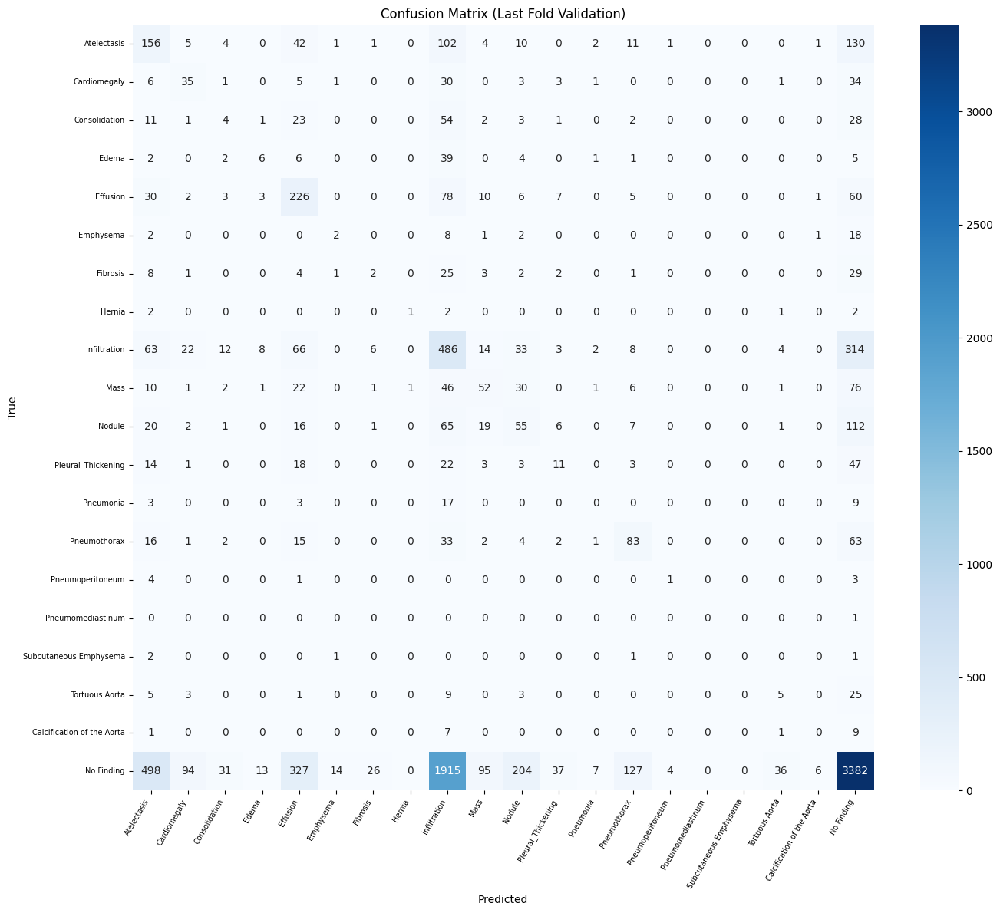

5370

In [8]:
# ============================================================
# Cell 7: Validation Analysis on Last Fold
# ============================================================

# Evaluate last trained fold on its validation set for detailed analysis
last_fold_idx = TRAIN_FOLDS[-1]
all_splits = list(
    StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED)
    .split(train_df, train_df["label"])
)
_, val_idx_last = all_splits[last_fold_idx]

df_val_last = train_df.iloc[val_idx_last]
val_ds_last = ChestXrayDataset(df_val_last, IMG_DIR, transform=val_transforms)
val_loader_last = DataLoader(
    val_ds_last, batch_size=BATCH_SIZE * 2, shuffle=False,
    num_workers=NUM_WORKERS, pin_memory=True
)

last_model = fold_models[-1]
last_model.eval()

cc_dummy = dict(Counter(train_df["label"].values))
crit_dummy = BalancedCELoss(cc_dummy, NUM_CLASSES).to(DEVICE)
_, val_score_last, val_preds, val_labels = validate(
    last_model, val_loader_last, crit_dummy, DEVICE
)

print(f"Last fold validation competition score: {val_score_last:.4f}\n")
print(classification_report(val_labels, val_preds, target_names=CLASS_NAMES, zero_division=0))

# Confusion matrix
fig, ax = plt.subplots(figsize=(14, 12))
cm = confusion_matrix(val_labels, val_preds)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES, ax=ax)
ax.set_xlabel("Predicted")
ax.set_ylabel("True")
ax.set_title("Confusion Matrix (Last Fold Validation)")
plt.xticks(rotation=60, ha="right", fontsize=7)
plt.yticks(fontsize=7)
plt.tight_layout()
plt.show()

del val_ds_last, val_loader_last
gc.collect()

In [9]:
# ============================================================
# Cell 8: Test Inference with TTA + Ensemble → submission.csv
# ============================================================

TTA_ROUNDS = 5  # number of TTA augmentation passes

test_ds_base = ChestXrayDataset(test_df, IMG_DIR, transform=val_transforms, is_test=True)
test_loader_base = DataLoader(
    test_ds_base, batch_size=BATCH_SIZE * 2, shuffle=False,
    num_workers=NUM_WORKERS, pin_memory=True,
)

# Accumulate soft predictions: (num_test, NUM_CLASSES)
ensemble_probs = np.zeros((len(test_df), NUM_CLASSES), dtype=np.float64)
all_ids = []

for model_idx, model in enumerate(tqdm(fold_models, desc="Ensemble models")):
    model.eval()

    # ---- Base inference (no augmentation) ----
    fold_probs = []
    for images, img_ids in tqdm(test_loader_base, desc=f"  Model {model_idx+1} base", leave=False):
        images = images.to(DEVICE, non_blocking=True)
        with torch.no_grad(), autocast():
            logits = model(images)
        probs = F.softmax(logits, dim=1).cpu().numpy()
        fold_probs.append(probs)
        if model_idx == 0:  # collect IDs once on first model pass
            all_ids.extend(img_ids)
    fold_probs = np.concatenate(fold_probs, axis=0)
    ensemble_probs += fold_probs

    # ---- TTA passes ----
    for tta_i in tqdm(range(TTA_ROUNDS), desc=f"  Model {model_idx+1} TTA", leave=False):
        test_ds_tta = ChestXrayDataset(test_df, IMG_DIR, transform=tta_transforms, is_test=True)
        test_loader_tta = DataLoader(
            test_ds_tta, batch_size=BATCH_SIZE * 2, shuffle=False,
            num_workers=NUM_WORKERS, pin_memory=True,
        )
        tta_probs = []
        for images, img_ids in tqdm(test_loader_tta, desc=f"    TTA {tta_i+1}", leave=False):
            images = images.to(DEVICE, non_blocking=True)
            with torch.no_grad(), autocast():
                logits = model(images)
            probs = F.softmax(logits, dim=1).cpu().numpy()
            tta_probs.append(probs)
        tta_probs = np.concatenate(tta_probs, axis=0)
        ensemble_probs += tta_probs

# Average over (num_folds × (1 + TTA_ROUNDS))
num_passes = len(fold_models) * (1 + TTA_ROUNDS)
ensemble_probs /= num_passes

# ---- Final predictions ----
final_preds = ensemble_probs.argmax(axis=1)

# ---- Build submission DataFrame ----
sub = pd.DataFrame({"id": all_ids})
for c_idx, c_name in enumerate(CLASS_NAMES):
    sub[c_name] = (final_preds == c_idx).astype(int)

# Sanity checks
assert sub[CLASS_NAMES].sum(axis=1).unique().tolist() == [1], \
    "ERROR: some rows don't have exactly one class set to 1!"
assert len(sub) == len(test_df), \
    f"ERROR: expected {len(test_df)} rows, got {len(sub)}"

sub.to_csv("submission.csv", index=False)
print(f"✅ submission.csv saved — {len(sub)} rows")
print(sub.head(10))

# Class distribution in predictions
print("\n--- Predicted Class Distribution (Test Set) ---")
for c_idx, c_name in enumerate(CLASS_NAMES):
    cnt = (final_preds == c_idx).sum()
    print(f"  {c_name:30s}  {cnt:6d}  ({cnt/len(final_preds)*100:.2f}%)")


Ensemble models:   0%|          | 0/3 [00:00<?, ?it/s]

  Model 1 base:   0%|          | 0/133 [00:00<?, ?it/s]

  Model 1 TTA:   0%|          | 0/5 [00:00<?, ?it/s]

    TTA 1:   0%|          | 0/133 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^AssertionError
: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

    TTA 2:   0%|          | 0/133 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

    TTA 3:   0%|          | 0/133 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           Exception ignored in: ^<function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>^
^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
^^    self._shutdown_workers()^^
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    ^^if w.is_alive():^
 ^  ^ ^ ^ ^ ^^^^^^^^

    TTA 4:   0%|          | 0/133 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^Exception ignored in: ^^<function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()^
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
^    ^if w.is_alive():
   ^ ^ ^^ ^ ^^^^^^^^

    TTA 5:   0%|          | 0/133 [00:00<?, ?it/s]

  Model 2 base:   0%|          | 0/133 [00:00<?, ?it/s]

  Model 2 TTA:   0%|          | 0/5 [00:00<?, ?it/s]

    TTA 1:   0%|          | 0/133 [00:00<?, ?it/s]

    TTA 2:   0%|          | 0/133 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
     Exception ignored in:   <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>^^
^Traceback (most recent call last):
Exception ignored in: ^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
<function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>    ^self._shutdown_workers()^

^Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __de

    TTA 3:   0%|          | 0/133 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

    TTA 4:   0%|          | 0/133 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

    TTA 5:   0%|          | 0/133 [00:00<?, ?it/s]

  Model 3 base:   0%|          | 0/133 [00:00<?, ?it/s]

  Model 3 TTA:   0%|          | 0/5 [00:00<?, ?it/s]

    TTA 1:   0%|          | 0/133 [00:00<?, ?it/s]

    TTA 2:   0%|          | 0/133 [00:00<?, ?it/s]

    TTA 3:   0%|          | 0/133 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^Exception ignored in: ^<function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>^
^^Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__

  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    self._shutdown_workers()    
assert self._parent_pid == os.getpid(), 'can only test a child process'
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
      if w.is_alive(): Exception ignored in:  
<function _MultiP

    TTA 4:   0%|          | 0/133 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
     Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>  
^^Traceback (most recent call last):
Exception ignored in: ^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
<function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>^    
^Traceback (most recent call last):
^self._shutdown_workers()
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_worke

    TTA 5:   0%|          | 0/133 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: Exception ignored in: can only test a child process<function _MultiProcessingDataLoaderIter.__del__ at 0x7e3a3a59dbc0>

Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    Exception ignored in: self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/d

✅ submission.csv saved — 17015 rows
                                     id  Atelectasis  Cardiomegaly  \
0  7b647fbfcc874a7084a4470fc150e267.png            0             0   
1  cc804b94d80c4a80a206298c307adfec.png            0             0   
2  1df09c3becd04de995244caae36ddf57.png            0             0   
3  044cac47cfdf4c8b90848c9e56c36bfa.png            0             0   
4  a873523c43664a049c5e8f26add7ecb2.png            0             0   
5  702afbb58a0c4d09aaccab5b4d82dd1b.png            0             0   
6  71aac847e86d46c7b133f0e80257626c.png            1             0   
7  df58ae5dcae841888e7ab590c29cd930.png            0             0   
8  f1969e0bb0f9452fbc45d6257d870b50.png            0             0   
9  673e834df2234e508e4ee7881b11b18b.png            0             0   

   Consolidation  Edema  Effusion  Emphysema  Fibrosis  Hernia  Infiltration  \
0              0      0         0          0         0       0             0   
1              0      0         0

In [10]:
# ============================================================
# Cell 9: Cost-sensitive prediction using competition scoring
# ============================================================
# The model was trained with balanced CE (no asymmetric cost).
# Now we apply the competition's asymmetric cost at prediction time.
#
# For each sample, instead of argmax(prob), we pick the class c that
# maximises the expected competition score:
#   E[score] = prob(c) * reward_TP - (1 - prob(c)) * cost_FN
# where reward_TP = 1/N_c  and  cost_FN = 5/N_c
#
# This simplifies to: pick c that maximises prob(c) * (1 + FN_WEIGHT) / N_c
# = prob(c) * 6 / N_c
# Since 6 is constant, we just pick c that maximises prob(c) / N_c

train_class_counts = train_df["label"].value_counts().sort_index().values.astype(float)

# ---- Try multiple alpha values and pick the best on validation ----
# alpha controls how much we trust the cost adjustment vs raw probabilities
# alpha=0: pure argmax (no adjustment), alpha=1: full 1/N_c adjustment
best_alpha = 0
best_val_score = -999

# Quick validation: re-run on last fold's validation probabilities
last_fold_idx = TRAIN_FOLDS[-1]
all_splits = list(
    StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED)
    .split(train_df, train_df["label"])
)
_, val_idx_last = all_splits[last_fold_idx]
df_val_last = train_df.iloc[val_idx_last]
val_ds_temp = ChestXrayDataset(df_val_last, IMG_DIR, transform=val_transforms)
val_loader_temp = DataLoader(
    val_ds_temp, batch_size=BATCH_SIZE * 2, shuffle=False,
    num_workers=NUM_WORKERS, pin_memory=True
)

# Get validation probabilities from last model
last_model = fold_models[-1]
last_model.eval()
val_probs_list, val_labels_list = [], []
for images, labels in tqdm(val_loader_temp, desc="Val probs", leave=False):
    images = images.to(DEVICE, non_blocking=True)
    with torch.no_grad(), autocast():
        logits = last_model(images)
    probs = F.softmax(logits, dim=1).cpu().numpy()
    val_probs_list.append(probs)
    val_labels_list.extend(labels.numpy())
val_probs_all = np.concatenate(val_probs_list, axis=0)
val_labels_all = np.array(val_labels_list)

print("Searching for best alpha...")
for alpha in np.arange(0.0, 1.05, 0.05):
    # Adjustment: prob * (1/N_c)^alpha
    adjustment = (1.0 / (train_class_counts + 1)) ** alpha
    adjustment = adjustment / adjustment.max()  # normalise
    adj_probs = val_probs_all * adjustment[np.newaxis, :]
    adj_preds = adj_probs.argmax(axis=1)
    score = compute_competition_score(val_labels_all, adj_preds)
    print(f"  alpha={alpha:.2f}  val_score={score:.4f}")
    if score > best_val_score:
        best_val_score = score
        best_alpha = alpha

print(f"\n✓ Best alpha = {best_alpha:.2f} (val score = {best_val_score:.4f})")

# ---- Apply best alpha to test predictions ----
adjustment = (1.0 / (train_class_counts + 1)) ** best_alpha
adjustment = adjustment / adjustment.max()

print(f"\nPer-class adjustment (alpha={best_alpha:.2f}):")
for c_idx, c_name in enumerate(CLASS_NAMES):
    print(f"  {c_name:30s}  adj={adjustment[c_idx]:.4f}")

adjusted_probs = ensemble_probs * adjustment[np.newaxis, :]
adjusted_preds = adjusted_probs.argmax(axis=1)

# Rebuild submission
sub_adj = pd.DataFrame({"id": all_ids})
for c_idx, c_name in enumerate(CLASS_NAMES):
    sub_adj[c_name] = (adjusted_preds == c_idx).astype(int)

assert sub_adj[CLASS_NAMES].sum(axis=1).unique().tolist() == [1]

sub_adj.to_csv("submission.csv", index=False)
print(f"\n✅ Cost-sensitive submission.csv saved — {len(sub_adj)} rows")

print("\n--- Predicted Class Distribution ---")
for c_idx, c_name in enumerate(CLASS_NAMES):
    cnt = (adjusted_preds == c_idx).sum()
    print(f"  {c_name:30s}  {cnt:6d}  ({cnt/len(adjusted_preds)*100:.2f}%)")

del val_ds_temp, val_loader_temp
gc.collect()

Val probs:   0%|          | 0/80 [00:00<?, ?it/s]

Searching for best alpha...
  alpha=0.00  val_score=-4.6292
  alpha=0.05  val_score=-4.6793
  alpha=0.10  val_score=-4.7205
  alpha=0.15  val_score=-4.7516
  alpha=0.20  val_score=-4.7915
  alpha=0.25  val_score=-4.8427
  alpha=0.30  val_score=-4.9409
  alpha=0.35  val_score=-5.0990
  alpha=0.40  val_score=-5.4804
  alpha=0.45  val_score=-6.9787
  alpha=0.50  val_score=-9.7442
  alpha=0.55  val_score=-15.5765
  alpha=0.60  val_score=-28.5790
  alpha=0.65  val_score=-51.4988
  alpha=0.70  val_score=-88.5293
  alpha=0.75  val_score=-131.5126
  alpha=0.80  val_score=-183.6368
  alpha=0.85  val_score=-234.9311
  alpha=0.90  val_score=-285.8430
  alpha=0.95  val_score=-332.3048
  alpha=1.00  val_score=-373.7533

✓ Best alpha = 0.00 (val score = -4.6292)

Per-class adjustment (alpha=0.00):
  Atelectasis                     adj=1.0000
  Cardiomegaly                    adj=1.0000
  Consolidation                   adj=1.0000
  Edema                           adj=1.0000
  Effusion               

572